# Trabajo Final de Biología de Sistemas (top genes variables)

- Antonio Elias Sánchez Soto
- Daniela Vento
- Yonathan Villavicencio

## Carga del conjunto de datos

Al revisar el txt previamente se muestran las células y los conteos de genes como una matriz de expresión, es necesario trasponer para tener células x genes

In [ ]:
import os
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [ ]:
#Configuración visual / reproducibilidad
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, figsize=(6, 5))
OUTPUT_DIR = "results_scRNA_top"
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [ ]:
#1) CARGA DE DATOS ---
# Ajusta el nombre de archivo si hace falta
fn = "wt_eco_sp2.txt"
df = pd.read_csv(fn, sep=r"\s+", index_col=0)
# df: filas = genes, columnas = células; transponer para AnnData
adata = sc.AnnData(df.T)
print(f"Original: {adata.n_obs} células × {adata.n_vars} genes")

Original: 6076 células × 27998 genes


Típicamente antes de la limpieza se aplican las métricas de calidad donde son evaluados los conteos de células y el porcentaje mitocondrial.

In [ ]:
#2) QC: métricas básicas ---
# Detectar genes mitocondriales (robusto para ratón/humano)
adata.var["mt"] = adata.var_names.str.lower().str.startswith("mt-")
# Opcional: ribosomales
adata.var["ribo"] = adata.var_names.str.lower().str.startswith(("rps", "rpl"))

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "ribo"],
    percent_top=None,
    log1p=False,
    inplace=True,
)

In [ ]:
# Guardar resumen estadístico
qc_summary = adata.obs[["n_genes_by_counts", "total_counts", "pct_counts_mt"]].describe()
qc_summary.to_csv(os.path.join(OUTPUT_DIR, "qc_summary_before_filtering.csv"))
print(qc_summary)

       n_genes_by_counts  total_counts  pct_counts_mt
count        6076.000000   6076.000000    6076.000000
mean         1964.253785   8482.491935       1.927124
std           805.687898   5608.977891       1.139059
min           779.000000   3471.000000       0.022821
25%          1388.000000   5079.750000       1.223945
50%          1801.000000   6897.500000       2.048842
75%          2278.250000   9776.250000       2.524386
max          6563.000000  64943.000000      20.492662


Interpretación: 
- Hay un mínimo de 779 genes por células
- La mayoría de las células tienen profundidades razonables según el cuartil 25% y 75%, sin embargo, existen outliers por el máximo que se muestra 
- La mayoría de las células tiene poco contenido mitocondrial (alrededor del 2%), sin embargo, hay un máximo de 20.49

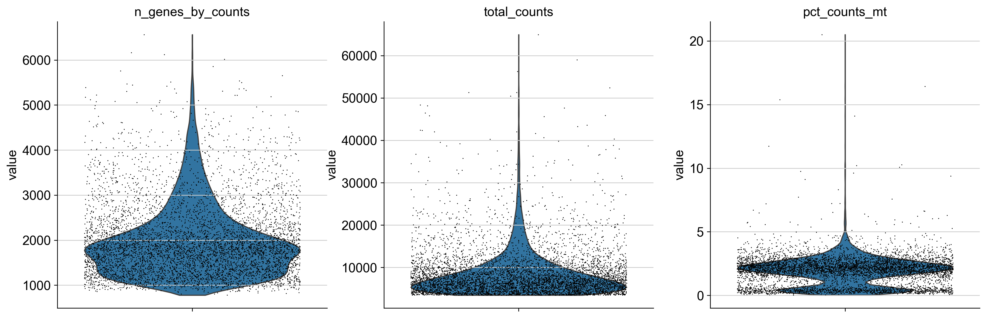

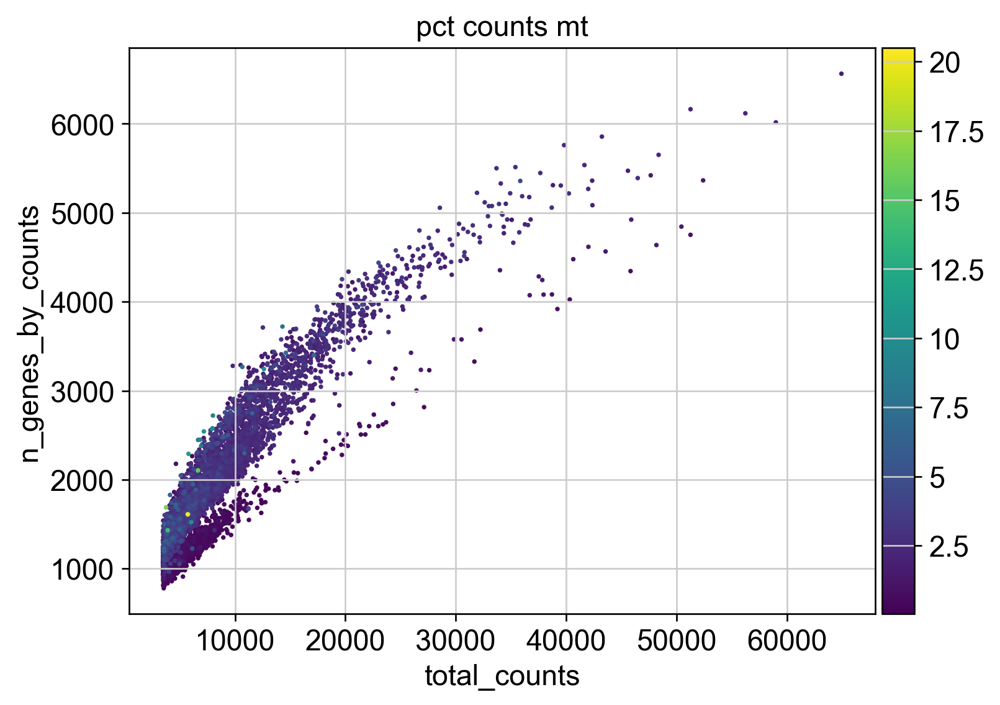

In [ ]:
#Plots QC inicial
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
             jitter=0.4, multi_panel=True, save="_qc_before.png")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt",
              save="_qc_scatter_before.png")

## Filtrado del dataset 

El conjunto de datos debe ser filtrado para que el análisis posterior sea valioso para la investigación. Deben ser eliminados los genes que a penas son detectados (umbral mínimo de 3 conteos). Se deberían filtrar las células aplicando un corte donde tengan cada una al menos 200 genes en su conteo, sin embargo, dado al mínimo de 779 genes, no es necesario hacer este corte. En cuanto al porcentaje de contenido mitocondrial dado los valores bastante bajos en el dataset (a excepción de algunos outliers con un 20%) se podría bajar a un máximo de 5%, siendo así estricto con el estrés/células dañadas.

In [ ]:
#3) FILTRADO (justificado en tu análisis) ---
# Filtrar genes expresados en pocas células
sc.pp.filter_genes(adata, min_cells=3)

# Filtrar células por % mitocondrial (estricto: 5%)
adata = adata[adata.obs["pct_counts_mt"] < 5, :].copy()

# (Opcional) filtrar por número de genes detectados si fuera necesario:
# adata = adata[adata.obs["n_genes_by_counts"] > 500, :].copy()

print(f"Después de filtrar: {adata.n_obs} células × {adata.n_vars} genes")

filtered out 13545 genes that are detected in less than 3 cells
Después de filtrar: 6030 células × 14453 genes


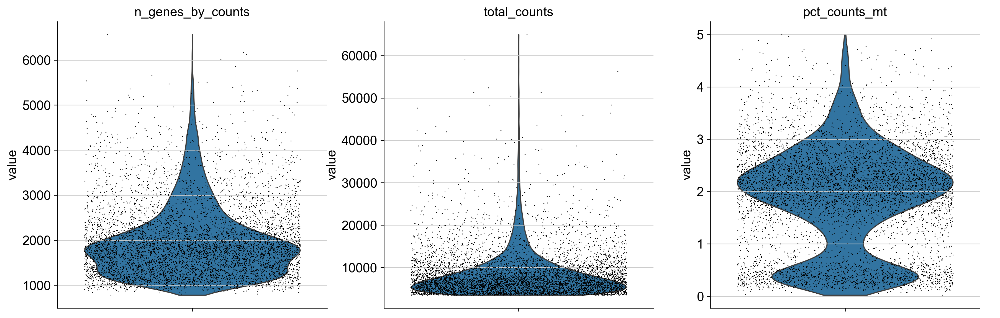

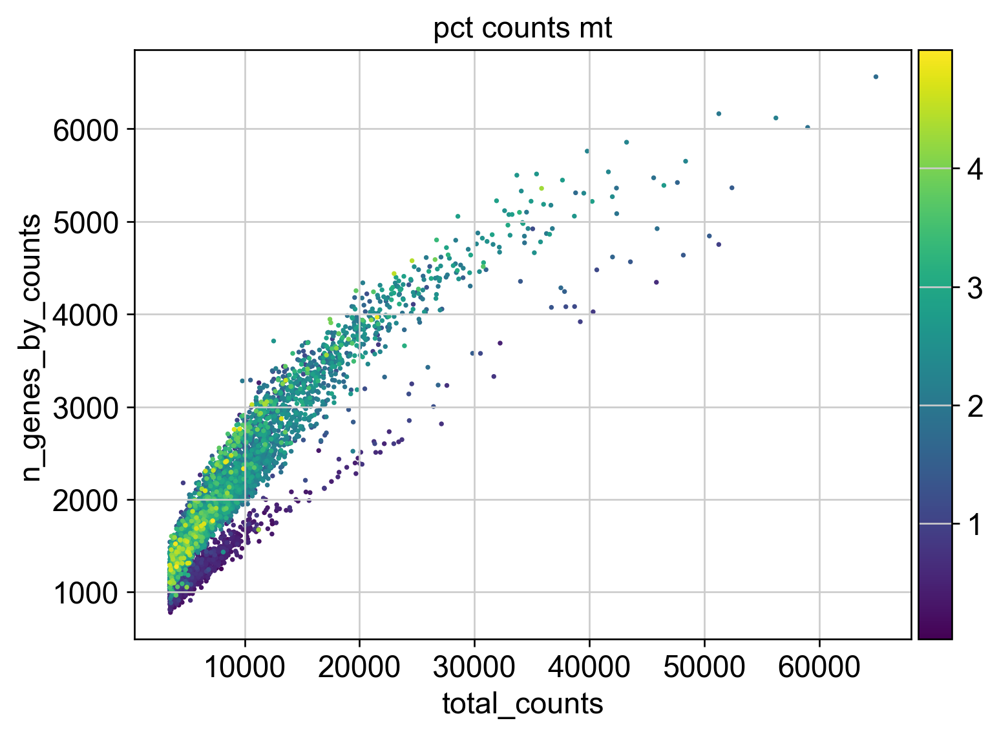

In [ ]:
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
             jitter=0.4, multi_panel=True, save="_qc_after.png")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt",
              save="_qc_scatter_after.png")


In [ ]:
# 4) NORMALIZACIÓN y LOG1P
#sc.pp.normalize_total(adata, target_sum=1e4)
#sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


In [ ]:
# Guardar copia normalizada completa para referencia
#adata.raw = adata.copy()  # preserva matriz normalizada/log en adata.raw


## Genes variables y reducción de dimensionalidad

Quedarse con los genes que varían entre células reduce la dimensionalidad, y permite quedarnos con genes informativos para distinguir tipos celulares y enfermedades.

Queremos que los genes no estén casi siempre apagandos, no sean muy abundantes en las células y se muestren variaciones informativas entre cada célula. Buscar un subconjunto manejable de genes que capturen eficientemente la heterogeneidad biológica entre las células. 

El enfoque moderno para identificar genes altamente variables es superior porque modela explícitamente la relación entre la media y la dispersión de los genes en datos de conteo crudos, ajustando una curva suave (por regresión local) y seleccionando los genes con mayor dispersión residual, es decir, variabilidad biológica genuina no explicada por el nivel de expresión. Esto evita el sesgo del método clásico (basado en umbrales fijos como min_disp), que favorece artificialmente a genes muy expresados. Además, al fijar un número objetivo de genes (n_top_genes), se garantiza reproducibilidad, estabilidad en análisis posteriores (como PCA y clustering) y comparabilidad entre experimentos. Este método, validado empíricamente en múltiples benchmarks y adoptado por herramientas líderes (Seurat v3+, Scanpy, scvi-tools), mejora la resolución de subtipos celulares y reduce el impacto del ruido técnico, constituyendo la mejor práctica actual en análisis de scRNA-seq.

In [ ]:
# 5) SELECCIÓN DE GENES ALTAMENTE VARIABLES (HVGs) ---
# Opciones: usar n_top_genes o umbrales. Aquí usamos n_top_genes=2000
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat", subset=False)
# Guardar lista HVGs
hvg_df = adata.var[adata.var["highly_variable"]].copy()
hvg_df.to_csv(os.path.join(OUTPUT_DIR, "highly_variable_genes.csv"))

extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


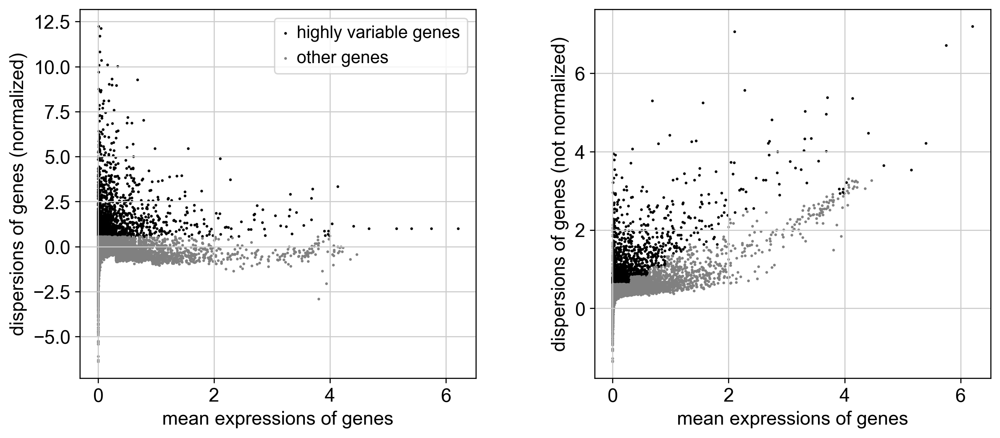

In [ ]:
# Visualizar HVGs
sc.pl.highly_variable_genes(adata, save="_highly_variable_genes.png")

In [ ]:
# Subconjunto para análisis (HVGs) — mantenemos adata.raw con los datos normalizados completos
adata_hvg = adata[:, adata.var["highly_variable"]].copy()
print(f"Objeto HVG: {adata_hvg.n_obs} células × {adata_hvg.n_vars} genes")

Objeto HVG: 6030 células × 2000 genes


In [ ]:
# 6) ESCALADO y PCA ---
# Escalar (media 0, var 1) con clipping
sc.pp.scale(adata_hvg, max_value=10)

computing PCA
    with n_comps=50
    finished (0:00:14)


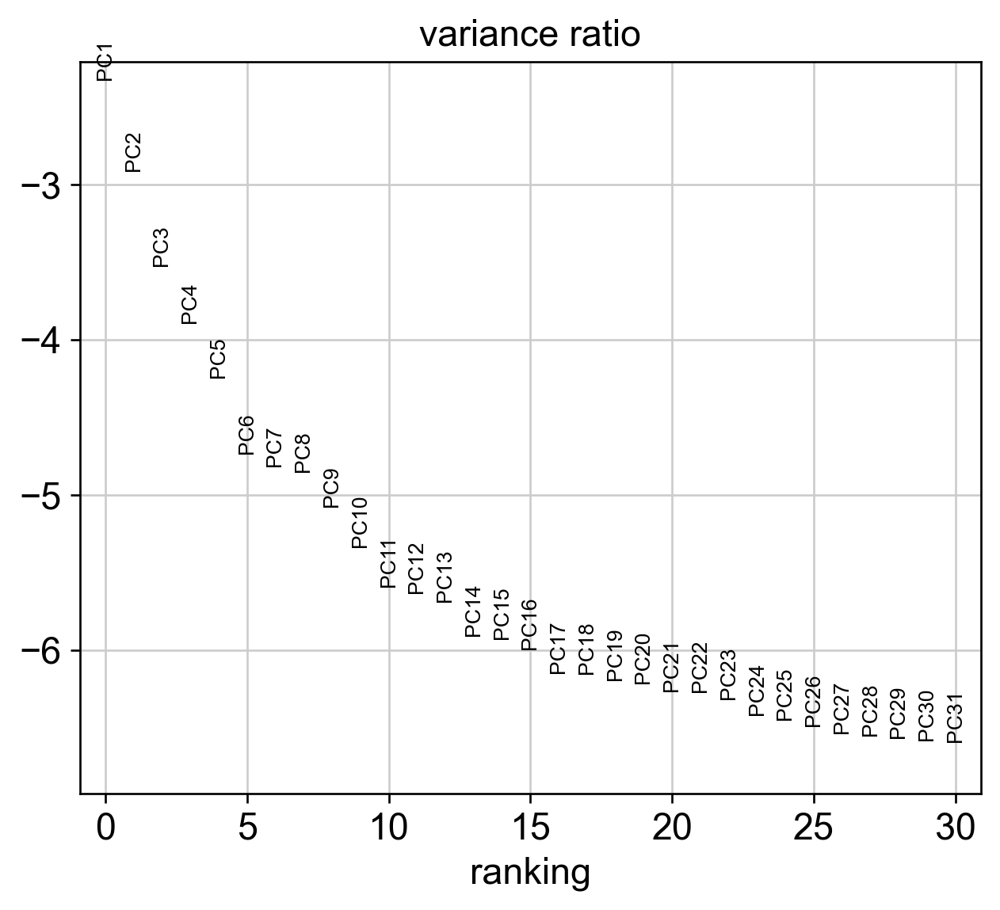

In [ ]:
# PCA
sc.tl.pca(adata_hvg, svd_solver="arpack", n_comps=50)
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=30, log=True, save="_pca_variance.png")


## Agrupamiento

Una vez realizado el PCA que reduce la información de los genes en pocas dimensiones se facilita el agrupamiento y aplicación de UMAP. Este último consiste en proyecciones 2D de la estructura global de los datos. Por otro lado, Leiden agrupa las células con perfiles de expresión parecidos en los clusteres que se establecen.

In [ ]:
# 7) Vecinos, UMAP y clustering (Leiden) ---
n_pcs = 20
sc.pp.neighbors(adata_hvg, n_neighbors=15, n_pcs=n_pcs)
sc.tl.umap(adata_hvg)

computing neighbors
    using 'X_pca' with n_pcs = 20


c:\Users\Yonathan\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:36)


In [ ]:
# Clustering: prueba una resolución razonable
resolution = 0.5
sc.tl.leiden(adata_hvg, resolution=resolution, key_added="leiden")

running Leiden clustering


C:\Users\Yonathan\AppData\Local\Temp\ipykernel_18840\520299276.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg, resolution=resolution, key_added="leiden")


    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


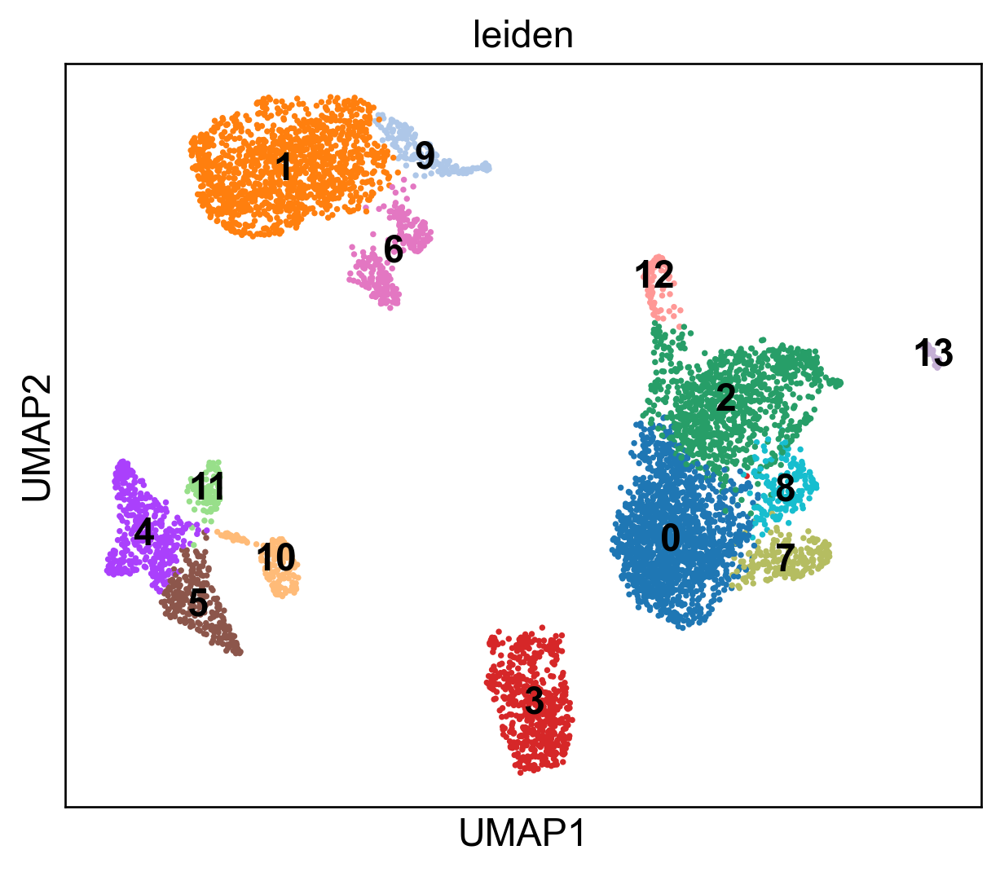

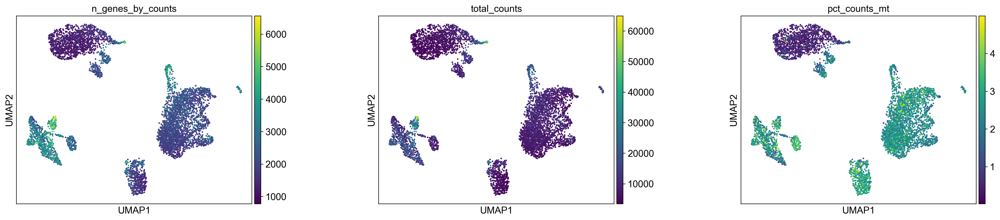

In [ ]:
# Visualizaciones
sc.pl.umap(adata_hvg, color=["leiden"], legend_loc="on data", save=f"_umap_leiden_r{resolution}.png")
sc.pl.umap(adata_hvg, color=["n_genes_by_counts", "total_counts", "pct_counts_mt"],
           wspace=0.4, save="_umap_qc_metrics.png")

## Aplicación de marcadores

Al visualizar los clusters donde se expresan los genes marcadores definidos se pueden asignar tipos celulares al cluster según la firma más presente.

In [ ]:
# 8) Marcadores diferenciales por cluster ---
sc.tl.rank_genes_groups(adata_hvg, groupby="leiden", method="wilcoxon")
# Exportar top marcadores por cluster a CSV
rk = sc.get.rank_genes_groups_df(adata_hvg, group=None)
rk.to_csv(os.path.join(OUTPUT_DIR, "rank_genes_groups_all_clusters.csv"), index=False)


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:47)


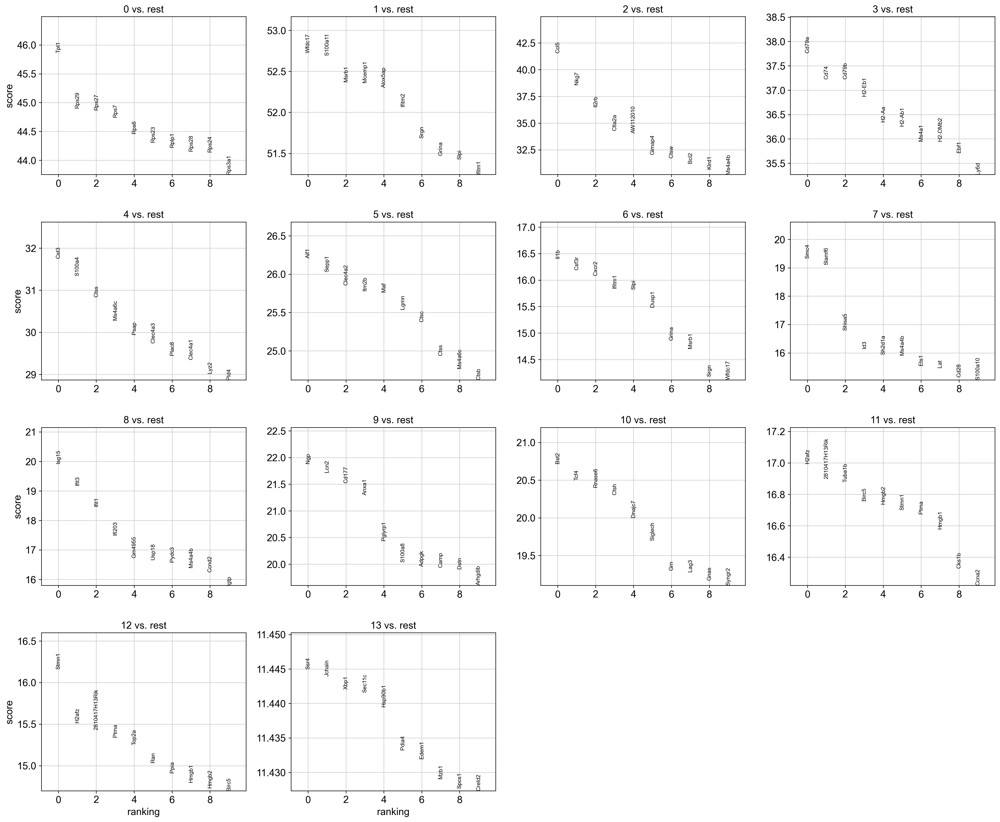

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


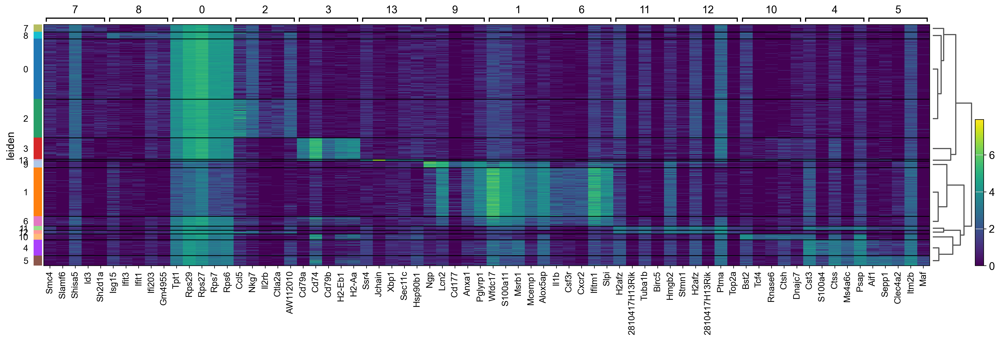

In [ ]:
# Plots de marcadores globales
sc.pl.rank_genes_groups(adata_hvg, n_genes=10, sharey=False, save="_rank_genes_groups_top10.png")
sc.pl.rank_genes_groups_heatmap(adata_hvg, n_genes=5, groupby="leiden", show_gene_labels=True,
                                save="_rank_genes_groups_heatmap_top5.png")


Se muestran 13 plots que contienen los 10 genes con mayor puntuación por agrupamiento.
Por ejemplo en el plot 1 tenemos que el gen con una puntación más alta es Wfdc17, lo que significa que este gen es el más expresado en el cluster 1. 


El análisis del gen Wfdc17 en la base de datos PanglaoDB muestra un patrón de expresión altamente específico y consistente con la identidad biológica esperada. En el barplot, la categoría Macrófagos presenta con diferencia la mayor cantidad de anotaciones celulares (>250), lo cual indica que este gen se expresa predominantemente en esta población. Una segunda barra clasificada como "Desconocida" alcanza alrededor de 100 anotaciones, lo que sugiere que existen células no clasificadas que probablemente también pertenecen a linajes mieloides estrechamente relacionados.

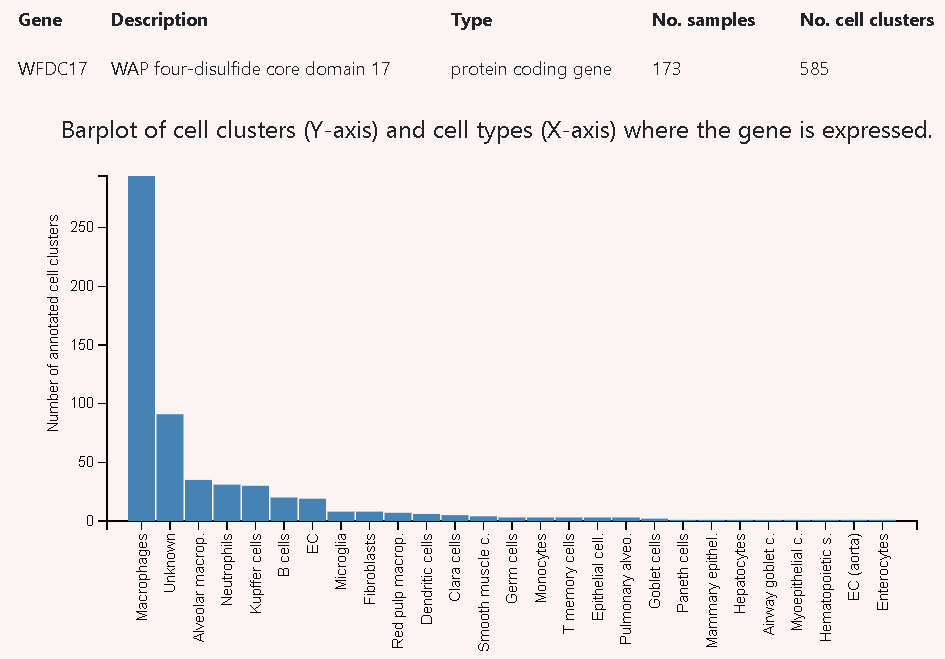

Para el mismo cluster 1 se realizó el mismo procedimiento pero esta vez con el gen S100a11, este posee alrededor de 300 anotaciones celulares en la categoría Macrófagos.

*Estos resultados permiten plantear  que el cluster 1 en el análisis scRNA-seq corresponde principalmente a macrófagos.*

In [ ]:
#Exportado en txt todos los genes por clusters
rank_df = pd.DataFrame(adata_hvg.uns['rank_genes_groups']['names'])
rank_df.to_csv("rank_genes_groups_names_table.txt", sep="\t", index=False)

In [ ]:
# 9) Visualización y comprobación de marcadores conocidos ---
marker_genes = [
    "S100a8", "S100a9", "Mmp9", "Csf3r", "Fcgr3", "Bst1",
    "Siglech", "Irf8", "Flt3",
    "Cd3d", "Cd3e", "Il2rb", "Cd4", "Cd8a", "Cd8b1",
    "Ms4a1", "Cd79a", "Cd79b", "Cd19",
    "Ccl9", "Csf1r", "S100a4"
]
present = [g for g in marker_genes if g in adata_hvg.var_names]
missing = [g for g in marker_genes if g not in adata_hvg.var_names]
print("Marcadores presentes:", present)
print("Marcadores ausentes:", missing)

Marcadores presentes: ['S100a8', 'S100a9', 'Mmp9', 'Csf3r', 'Fcgr3', 'Bst1', 'Siglech', 'Irf8', 'Flt3', 'Il2rb', 'Cd4', 'Cd8a', 'Cd8b1', 'Ms4a1', 'Cd79a', 'Cd79b', 'Cd19', 'Ccl9', 'Csf1r', 'S100a4']
Marcadores ausentes: ['Cd3d', 'Cd3e']


In [ ]:
# Dotplot por cluster (usa los genes presentes)
grouped = {
    "Neutrófilos": ["Mmp9", "Csf3r", "Fcgr3", "Bst1"],
    "Dendríticas": ["Siglech", "Irf8", "Flt3"],
    "T_cells": ["Il2rb", "Cd4", "Cd8a", "Cd8b1"],
    "B_cells": ["Ms4a1", "Cd79a", "Cd79b", "Cd19"],
    "Monocitos_mieloides": ["Ccl9", "Csf1r", "S100a4", "Fcgr3"]
}

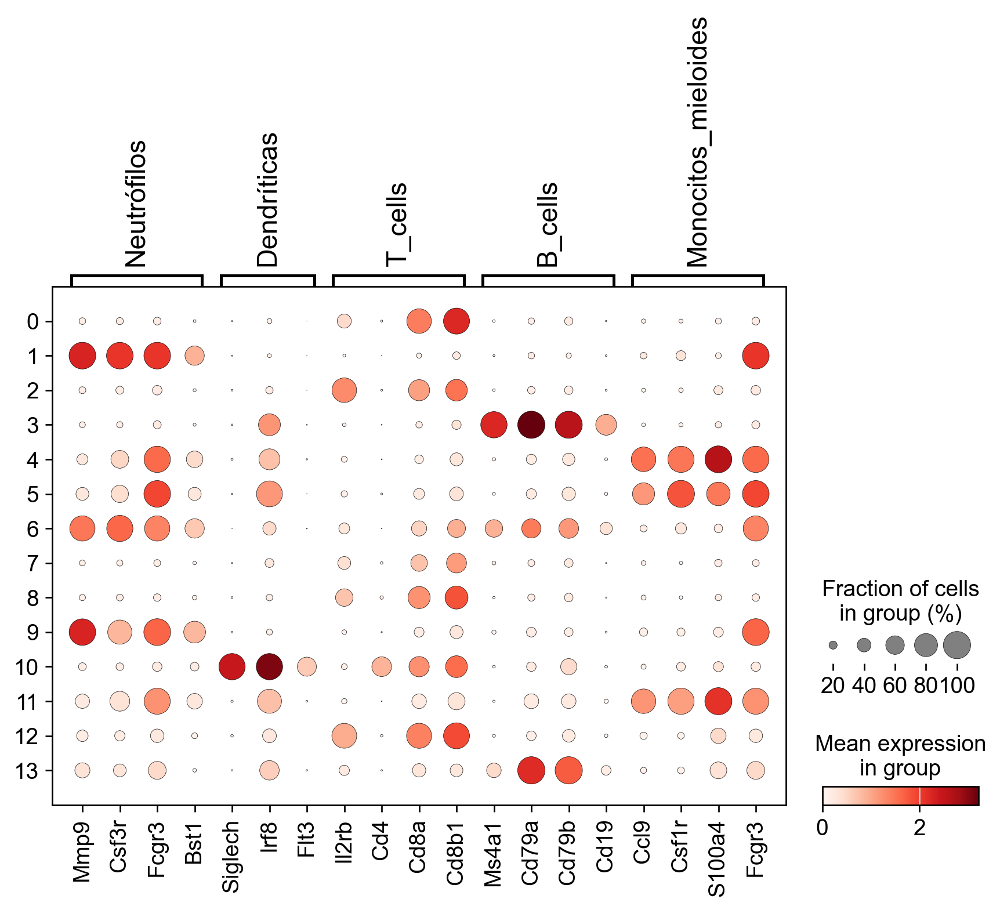

In [ ]:
# Filtrar genes inexistentes en las listas
for k in list(grouped.keys()):
    grouped[k] = [g for g in grouped[k] if g in adata_hvg.var_names]

sc.pl.dotplot(adata_hvg, var_names=grouped, groupby="leiden", save="_dotplot_markers.png")

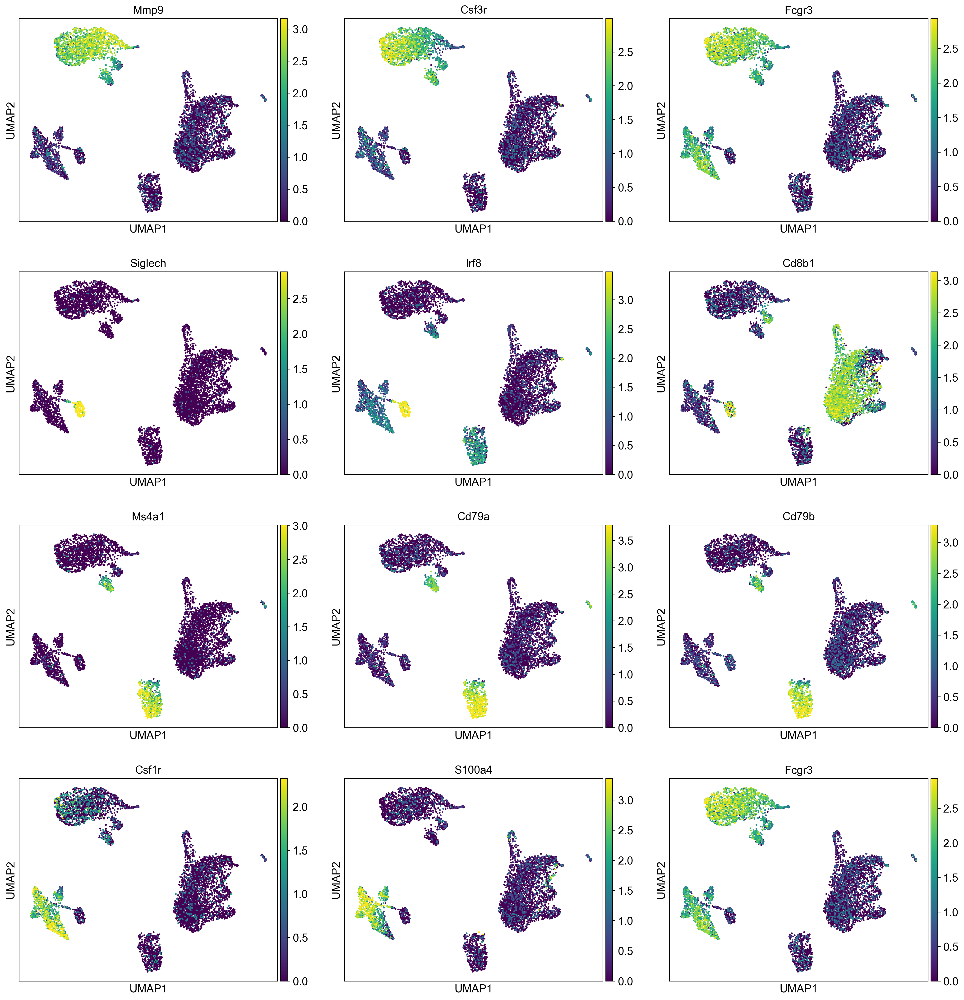

In [ ]:
# UMAPs individuales para marcadores clave (ajusta lista según presencia)
markers_to_plot = [g for g in ["Mmp9", "Csf3r", "Fcgr3","Siglech", "Irf8", "Cd8b1", "Ms4a1","Cd79a","Cd79b", "Csf1r", "S100a4","Fcgr3"] if g in adata_hvg.var_names]

if markers_to_plot:
    sc.pl.umap(adata_hvg, color=markers_to_plot, ncols=3, vmax="p99", save="_umap_markers.png")


In [ ]:
import numpy as np

In [ ]:
# Filtrar solo marcadores presentes en los datos
marker_dict = {
    celltype: [g for g in genes if g in adata_hvg.var_names]
    for celltype, genes in grouped.items()
}

print("Marcadores utilizados por tipo celular:")
print(marker_dict)

Marcadores utilizados por tipo celular:
{'Neutrófilos': ['Mmp9', 'Csf3r', 'Fcgr3', 'Bst1'], 'Dendríticas': ['Siglech', 'Irf8', 'Flt3'], 'T_cells': ['Il2rb', 'Cd4', 'Cd8a', 'Cd8b1'], 'B_cells': ['Ms4a1', 'Cd79a', 'Cd79b', 'Cd19'], 'Monocitos_mieloides': ['Ccl9', 'Csf1r', 'S100a4', 'Fcgr3']}


In [ ]:
#Calcular expresión promedio por clúster y por tipo celular ---
cluster_ids = adata_hvg.obs["leiden"].unique().astype(str)
cluster_annotation = {}

for cl in cluster_ids:
    cells = adata_hvg[adata_hvg.obs["leiden"] == cl]
    
    scores = {}
    for celltype, genes in marker_dict.items():
        if len(genes) > 0:
            # Expresión promedio del tipo celular para ese clúster
            score = np.mean(cells[:, genes].X.toarray())
        else:
            score = 0
        scores[celltype] = score
    
    # Elegir la categoría con mayor score
    best_type = max(scores, key=scores.get)
    cluster_annotation[cl] = best_type

In [ ]:
#Agregar anotación al objeto AnnData ---
adata_hvg.obs["celltype"] = adata_hvg.obs["leiden"].map(cluster_annotation)

In [ ]:
#Mostrar tabla final de anotaciones ---
print("\n=== ANOTACIÓN FINAL DE CLÚSTERES ===")
df_annot = pd.DataFrame.from_dict(cluster_annotation, orient="index", columns=["CellType"])
df_annot.index.name = "Cluster"
print(df_annot)


=== ANOTACIÓN FINAL DE CLÚSTERES ===
                    CellType
Cluster                     
0                    T_cells
4        Monocitos_mieloides
8                    T_cells
2                    T_cells
10               Dendríticas
3                    B_cells
5        Monocitos_mieloides
9                Neutrófilos
6                    B_cells
1                Neutrófilos
13                   B_cells
12                   T_cells
7                    T_cells
11       Monocitos_mieloides
